# U-Net

In [1]:
%load_ext autoreload
%autoreload 2

import aribu            # GDAL fix, please keep this as the first import

import json
import platform
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import segmentation_models_pytorch as smp
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

from aribu.paths import *
from aribu.dataset import *
from aribu.baseline import *
from aribu.viz import *
from aribu.metrics import *
from aribu.model import *
from aribu.train import *
from aribu.report import *

torch.manual_seed(0)
print(DEVICE, "| torch", torch.__version__, "| smp", smp.__version__)

cuda | torch 2.13.0 | smp 0.5.0


In [2]:
splits = load_splits()
STATS = json.loads((RESULTS_DIR / "norm_stats.json").read_text())
MEAN, STD = STATS["mean"], STATS["std"]
BASELINE = json.loads((RESULTS_DIR / "baseline.json").read_text())

EPOCHS = 30
CHIPS = ["Mekong_922373", "Ghana_141910", "Ghana_147015", "Paraguay_126224", "Spain_3285448",
         "USA_86502", "Bolivia_129334", "Bolivia_314919"]

print({k: len(v) for k, v in splits.items()})
print(f"baseline (test): micro IoU {BASELINE['headline']['micro_iou']:.4f} -- the number to beat")

{'train': 252, 'val': 89, 'test': 90, 'bolivia': 15}
baseline (test): micro IoU 0.5902 -- the number to beat


# Part I. Two U-Nets, trained on Sentinel 1 chips

## 1. Data and training setup

In [3]:
X_train, y_train = build_cache(splits["train"], "s1", MEAN, STD, "train")
X_val, y_val = build_cache(splits["val"], "s1", MEAN, STD, "val")
s1_loader = DataLoader(ChipData(X_train, y_train), batch_size=BATCH, shuffle=True, drop_last=True)

print(f"{len(X_train)} train + {len(X_val)} val chips, {X_train.shape[1]} channels")

252 train + 89 val chips, 2 channels


## 2. A U-Net by hand

Following the 2015 U-Net paper, with a few modern changes: `padding=1` so the skip connections line
up without cropping, BatchNorm after every convolution, and `F.interpolate` instead of
`nn.ConvTranspose2d`.

<svg xmlns="http://www.w3.org/2000/svg" width="680" height="570" viewBox="0 0 680 570"><defs><marker id="arrow" viewBox="0 0 10 10" refX="8" refY="5" markerWidth="6" markerHeight="6" orient="auto"><path d="M2 1L8 5L2 9" fill="none" stroke="#5F5E5A" stroke-width="1.5" stroke-linecap="round" stroke-linejoin="round"/></marker></defs><rect x="60" y="40" width="190" height="44" rx="8" fill="#F1EFE8" stroke="#5F5E5A" stroke-width="0.8"/><text x="155.0" y="62.0" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="14" font-weight="500" fill="#2C2C2A">input: 2 ch, 512²</text><rect x="430" y="40" width="190" height="44" rx="8" fill="#F1EFE8" stroke="#5F5E5A" stroke-width="0.8"/><text x="525.0" y="62.0" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="14" font-weight="500" fill="#2C2C2A">head: 1×1 conv, 1 ch</text><rect x="60" y="110" width="190" height="56" rx="8" fill="#EEEDFE" stroke="#534AB7" stroke-width="0.8"/><text x="155.0" y="130" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="14" font-weight="500" fill="#3C3489">down 1: 2 → 32</text><text x="155.0" y="150" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="12" fill="#534AB7">512²</text><rect x="60" y="200" width="190" height="56" rx="8" fill="#EEEDFE" stroke="#534AB7" stroke-width="0.8"/><text x="155.0" y="220" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="14" font-weight="500" fill="#3C3489">down 2: 32 → 64</text><text x="155.0" y="240" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="12" fill="#534AB7">256²</text><rect x="60" y="290" width="190" height="56" rx="8" fill="#EEEDFE" stroke="#534AB7" stroke-width="0.8"/><text x="155.0" y="310" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="14" font-weight="500" fill="#3C3489">down 3: 64 → 128</text><text x="155.0" y="330" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="12" fill="#534AB7">128²</text><rect x="60" y="380" width="190" height="56" rx="8" fill="#EEEDFE" stroke="#534AB7" stroke-width="0.8"/><text x="155.0" y="400" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="14" font-weight="500" fill="#3C3489">down 4: 128 → 256</text><text x="155.0" y="420" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="12" fill="#534AB7">64²</text><rect x="245" y="470" width="190" height="56" rx="8" fill="#FAECE7" stroke="#993C1D" stroke-width="0.8"/><text x="340.0" y="490" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="14" font-weight="500" fill="#712B13">bottleneck: 256 → 512</text><text x="340.0" y="510" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="12" fill="#993C1D">32²</text><rect x="430" y="380" width="190" height="56" rx="8" fill="#E1F5EE" stroke="#0F6E56" stroke-width="0.8"/><text x="525.0" y="400" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="14" font-weight="500" fill="#085041">up 1: 768 → 256</text><text x="525.0" y="420" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="12" fill="#0F6E56">64²</text><rect x="430" y="290" width="190" height="56" rx="8" fill="#E1F5EE" stroke="#0F6E56" stroke-width="0.8"/><text x="525.0" y="310" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="14" font-weight="500" fill="#085041">up 2: 384 → 128</text><text x="525.0" y="330" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="12" fill="#0F6E56">128²</text><rect x="430" y="200" width="190" height="56" rx="8" fill="#E1F5EE" stroke="#0F6E56" stroke-width="0.8"/><text x="525.0" y="220" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="14" font-weight="500" fill="#085041">up 3: 192 → 64</text><text x="525.0" y="240" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="12" fill="#0F6E56">256²</text><rect x="430" y="110" width="190" height="56" rx="8" fill="#E1F5EE" stroke="#0F6E56" stroke-width="0.8"/><text x="525.0" y="130" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="14" font-weight="500" fill="#085041">up 4: 96 → 32</text><text x="525.0" y="150" text-anchor="middle" dominant-baseline="central" font-family="Helvetica, Arial, sans-serif" font-size="12" fill="#0F6E56">512²</text><line x1="155" y1="84" x2="155" y2="104" stroke="#5F5E5A" stroke-width="1.5" marker-end="url(#arrow)"/><path d="M155 436 L155 455 L340 455 L340 464" fill="none" stroke="#5F5E5A" stroke-width="1.5" marker-end="url(#arrow)"/><path d="M435 498 L525 498 L525 442" fill="none" stroke="#5F5E5A" stroke-width="1.5" marker-end="url(#arrow)"/><line x1="525" y1="110" x2="525" y2="88" stroke="#5F5E5A" stroke-width="1.5" marker-end="url(#arrow)"/><line x1="155" y1="166" x2="155" y2="194" stroke="#5F5E5A" stroke-width="1.5" marker-end="url(#arrow)"/><line x1="155" y1="256" x2="155" y2="284" stroke="#5F5E5A" stroke-width="1.5" marker-end="url(#arrow)"/><line x1="155" y1="346" x2="155" y2="374" stroke="#5F5E5A" stroke-width="1.5" marker-end="url(#arrow)"/><line x1="525" y1="380" x2="525" y2="352" stroke="#5F5E5A" stroke-width="1.5" marker-end="url(#arrow)"/><line x1="525" y1="290" x2="525" y2="262" stroke="#5F5E5A" stroke-width="1.5" marker-end="url(#arrow)"/><line x1="525" y1="200" x2="525" y2="172" stroke="#5F5E5A" stroke-width="1.5" marker-end="url(#arrow)"/><text x="268" y="180" text-anchor="start" font-family="Helvetica, Arial, sans-serif" font-size="12" fill="#5F5E5A">max pool ÷2</text><text x="412" y="180" text-anchor="end" font-family="Helvetica, Arial, sans-serif" font-size="12" fill="#5F5E5A">interpolate ×2</text><text x="268" y="270" text-anchor="start" font-family="Helvetica, Arial, sans-serif" font-size="12" fill="#5F5E5A">max pool ÷2</text><text x="412" y="270" text-anchor="end" font-family="Helvetica, Arial, sans-serif" font-size="12" fill="#5F5E5A">interpolate ×2</text><text x="268" y="360" text-anchor="start" font-family="Helvetica, Arial, sans-serif" font-size="12" fill="#5F5E5A">max pool ÷2</text><text x="412" y="360" text-anchor="end" font-family="Helvetica, Arial, sans-serif" font-size="12" fill="#5F5E5A">interpolate ×2</text><line x1="252" y1="138" x2="424" y2="138" stroke="#5F5E5A" stroke-width="1.5" stroke-dasharray="4 3" marker-end="url(#arrow)"/><line x1="252" y1="228" x2="424" y2="228" stroke="#5F5E5A" stroke-width="1.5" stroke-dasharray="4 3" marker-end="url(#arrow)"/><line x1="252" y1="318" x2="424" y2="318" stroke="#5F5E5A" stroke-width="1.5" stroke-dasharray="4 3" marker-end="url(#arrow)"/><line x1="252" y1="408" x2="424" y2="408" stroke="#5F5E5A" stroke-width="1.5" stroke-dasharray="4 3" marker-end="url(#arrow)"/></svg>

In [4]:
def double_conv(cin, cout):
    return nn.Sequential(
        nn.Conv2d(cin, cout, 3, padding=1), nn.BatchNorm2d(cout), nn.ReLU(inplace=True),
        nn.Conv2d(cout, cout, 3, padding=1), nn.BatchNorm2d(cout), nn.ReLU(inplace=True))


class UNet(nn.Module):
    def __init__(self, in_ch=2, widths=(32, 64, 128, 256, 512)):
        super().__init__()
        self.downs = nn.ModuleList([double_conv(a, b)
                                    for a, b in zip((in_ch,) + widths[:-1], widths)])
        self.ups = nn.ModuleList([double_conv(widths[i] + widths[i - 1], widths[i - 1])
                                  for i in range(len(widths) - 1, 0, -1)])
        self.pool = nn.MaxPool2d(2)
        self.head = nn.Conv2d(widths[0], 1, 1)

    def forward(self, x):
        skips = []
        for down in self.downs[:-1]:
            x = down(x)
            skips.append(x)
            x = self.pool(x)
        x = self.downs[-1](x)           # bottleneck
        for up, skip in zip(self.ups, reversed(skips)):
            x = F.interpolate(x, scale_factor=2, mode="bilinear", align_corners=False)
            x = up(torch.cat([skip, x], dim=1))
        return self.head(x)         # (B, 1, H, W) logits

In [5]:
def n_params(model):
    return sum(p.numel() for p in model.parameters()) / 1e6


torch.manual_seed(0)
custom = UNet(in_ch=X_train.shape[1])
custom_iou, custom_hist = train(custom, s1_loader, X_val, y_val, epochs=EPOCHS)
print(f"custom U-Net: best val IoU {custom_iou:.4f}   ({n_params(custom):.1f}M parameters)")

100%|██████████| 30/30 [06:04<00:00, 12.14s/it, loss=0.1399, val_iou=0.6160]

custom U-Net: best val IoU 0.6390   (7.9M parameters)


## 3. `smp.Unet` with a ResNet-34 encoder

In [6]:
torch.manual_seed(0)
smp_unet = build_unet(X_train.shape[1])
smp_iou, smp_hist = train(smp_unet, s1_loader, X_val, y_val, epochs=EPOCHS)
print(f"smp.Unet {ENCODER}: best val IoU {smp_iou:.4f}   ({n_params(smp_unet):.1f}M parameters)")

100%|██████████| 30/30 [03:19<00:00,  6.65s/it, loss=0.0949, val_iou=0.6271]

smp.Unet resnet34: best val IoU 0.6473   (24.4M parameters)


## 4. U-Net vs U-Net

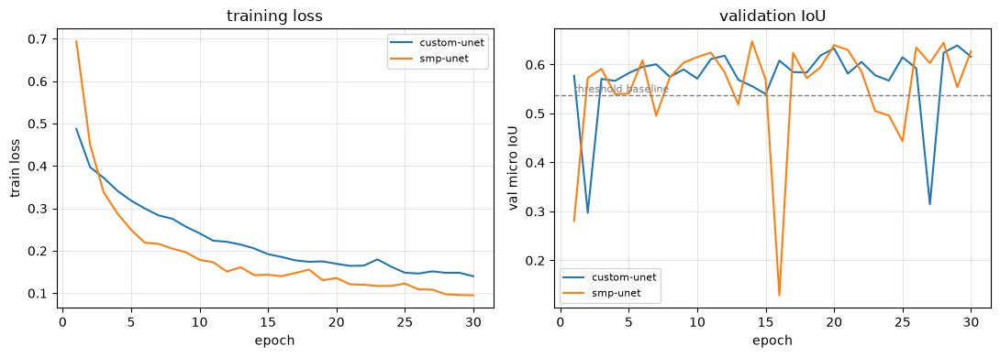

In [7]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 4))
for name, h in (("custom-unet", custom_hist), ("smp-unet", smp_hist)):
    ax1.plot(h["epoch"], h["loss"], label=name)
    ax2.plot(h["epoch"], h["val_iou"], label=name)

ax2.axhline(BASELINE["splits"]["val"]["micro"]["iou"], color="grey", linestyle="--", linewidth=1)
ax2.annotate("threshold baseline", (1, BASELINE["splits"]["val"]["micro"]["iou"]),
             fontsize=8, va="bottom", color="grey")
ax1.set(xlabel="epoch", ylabel="train loss", title="training loss")
ax2.set(xlabel="epoch", ylabel="val micro IoU", title="validation IoU")
for ax in (ax1, ax2):
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

In [8]:
baseline = make_baseline_predictor(BASELINE["config"])
baseline_for_chip = lambda _chip_id: baseline
part1 = {"threshold (nb02)": baseline_for_chip,
         "custom-unet": make_predictor(custom, "s1", MEAN, STD),
         "smp-unet": make_predictor(smp_unet, "s1", MEAN, STD)}

for split in ("test", "bolivia"):
    print(split.upper())
    display(compare(*[evaluate_with_chip_id(fn, splits[split], name)
                      for name, fn in part1.items()]))

TEST


,iou (micro),f1 (micro),precision (micro),recall (micro),accuracy (micro),iou (macro),f1 (macro)
threshold (nb02),0.5902,0.7423,0.8219,0.6767,0.9422,0.3142,0.4042
custom-unet,0.6575,0.7934,0.7748,0.8128,0.9479,0.4032,0.5111
smp-unet,0.6723,0.8040,0.8681,0.7487,0.9551,0.3637,0.4539


BOLIVIA


,iou (micro),f1 (micro),precision (micro),recall (micro),accuracy (micro),iou (macro),f1 (macro)
threshold (nb02),0.5951,0.7462,0.9223,0.6265,0.9318,0.3544,0.4567
custom-unet,0.6702,0.8026,0.8376,0.7704,0.9394,0.4119,0.5035
smp-unet,0.7009,0.8241,0.8923,0.7656,0.9477,0.4219,0.5092


The winner is `smp_unet`, decided on validation micro IoU. Let's save it for later:

In [9]:
models, hists, best_val = {"s1": smp_unet}, {"s1": smp_hist}, {"s1": smp_iou}
del X_train, y_train, X_val, y_val, s1_loader

# Part II. Does Sentinel-2 help?

## 5. The optical channels


Because water strongly absorbs near-infrared and shortwave-infrared and primarily reflects green light, it is standard to use the following two water indices for waterbody detection:

- **NDWI (Normalized Difference Water Index)** = (green - NIR) / (green + NIR)
- **MNDWI (Modified Normalized Difference Water Index)** = (green - SWIR1) / (green + SWIR1)

This can be demonstrated visually:

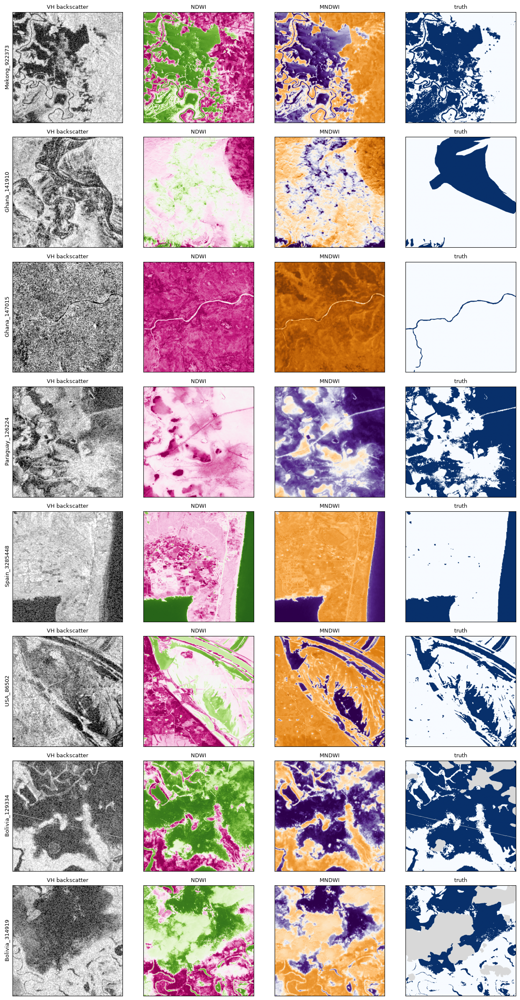

In [10]:
fig, axes = plt.subplots(len(CHIPS), 4, figsize=(13, 3.0 * len(CHIPS)))
for row, chip_id in zip(axes, CHIPS, strict=True):
    c, ind = load_chip(chip_id), water_indices(chip_id)
    v, water = valid_mask(c), c.label == LABEL_WATER

    for ax, arr, title in zip(row, [c.vh, ind[0], ind[1], np.ma.masked_where(~v, water)],
                              ["VH backscatter", "NDWI", "MNDWI", "truth"], strict=True):
        if title in INDEX_CMAPS:
            m = np.percentile(np.abs(arr), 98)
            ax.imshow(arr, cmap=INDEX_CMAPS[title], vmin=-m, vmax=m)
        else:
            lo, hi = percentile_limits(c.vh) if title != "truth" else (None, None)
            ax.imshow(arr, cmap="gray" if title != "truth" else LABEL_CMAP, vmin=lo, vmax=hi)
        ax.set(title=title, xticks=[], yticks=[])
        ax.title.set_fontsize(9)
    row[0].set_ylabel(chip_id, fontsize=9)

fig.tight_layout()
plt.show()

Note that unlike the radar images from Sentinel 1, the visibility of Sentinel 2 images is negatively affected by clouds due to their optical nature.

## 6. Training with S2

Let's train `smp.Unet` on the S2 chips (NDWI, MNDWI), as well as on S1 & S2 chips stacked (VV, VH, NDWI, MNDWI).

In the following, `ARMS = ("s1", "s1+s2", "s2")`.

In [11]:
for arm in [a for a in ARMS if a not in models]:
    X_train, y_train = build_cache(splits["train"], arm, MEAN, STD, f"{arm} train")
    X_val, y_val = build_cache(splits["val"], arm, MEAN, STD, f"{arm} val")
    loader = DataLoader(ChipData(X_train, y_train), batch_size=BATCH, shuffle=True, drop_last=True)

    torch.manual_seed(0)
    model = build_unet(X_train.shape[1])
    best_val[arm], hists[arm] = train(model, loader, X_val, y_val, epochs=EPOCHS)
    models[arm] = model
    print(f"{arm:6s} ({X_train.shape[1]} ch): best val IoU {best_val[arm]:.4f}")
    del X_train, y_train, X_val, y_val, loader

100%|██████████| 30/30 [03:30<00:00,  7.01s/it, loss=0.0760, val_iou=0.7591]


s1+s2  (4 ch): best val IoU 0.7749


100%|██████████| 30/30 [03:33<00:00,  7.12s/it, loss=0.0655, val_iou=0.8137]

s2     (2 ch): best val IoU 0.8137


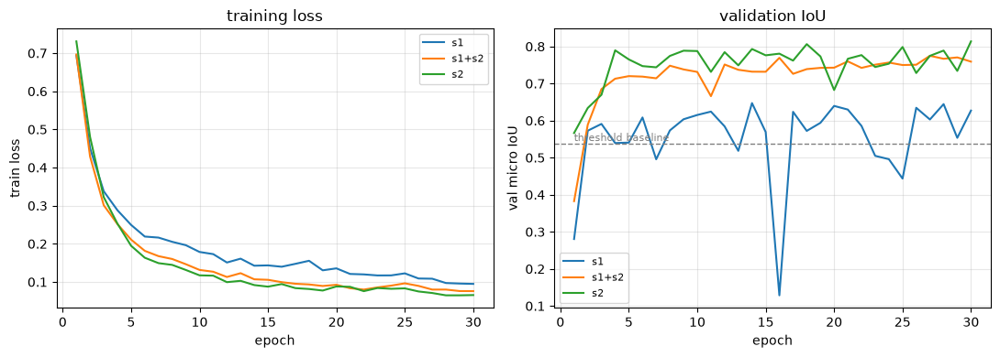

In [12]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 4))
for arm in ARMS:
    ax1.plot(hists[arm]["epoch"], hists[arm]["loss"], label=arm)
    ax2.plot(hists[arm]["epoch"], hists[arm]["val_iou"], label=arm)

ax2.axhline(BASELINE["splits"]["val"]["micro"]["iou"], color="grey", linestyle="--", linewidth=1)
ax2.annotate("threshold baseline", (1, BASELINE["splits"]["val"]["micro"]["iou"]),
             fontsize=8, va="bottom", color="grey")
ax1.set(xlabel="epoch", ylabel="train loss", title="training loss")
ax2.set(xlabel="epoch", ylabel="val micro IoU", title="validation IoU")
for ax in (ax1, ax2):
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

## 7. Against the baseline

In [13]:
predictors = {"threshold (nb02)": baseline_for_chip,
              **{arm: make_predictor(models[arm], arm, MEAN, STD) for arm in ARMS}}

results = {split: [evaluate_with_chip_id(fn, splits[split], name)
                   for name, fn in predictors.items()]
           for split in ("test", "bolivia")}

for split, rs in results.items():
    print(split.upper())
    display(compare(*rs))

TEST


,iou (micro),f1 (micro),precision (micro),recall (micro),accuracy (micro),iou (macro),f1 (macro)
threshold (nb02),0.5902,0.7423,0.8219,0.6767,0.9422,0.3142,0.4042
s1,0.6723,0.8040,0.8681,0.7487,0.9551,0.3637,0.4539
s1+s2,0.8071,0.8933,0.9362,0.8541,0.9749,0.5196,0.6222
s2,0.8304,0.9073,0.9135,0.9013,0.9774,0.5821,0.6819


BOLIVIA


,iou (micro),f1 (micro),precision (micro),recall (micro),accuracy (micro),iou (macro),f1 (macro)
threshold (nb02),0.5951,0.7462,0.9223,0.6265,0.9318,0.3544,0.4567
s1,0.7009,0.8241,0.8923,0.7656,0.9477,0.4219,0.5092
s1+s2,0.8036,0.8911,0.8715,0.9117,0.9644,0.5496,0.6389
s2,0.7960,0.8864,0.8590,0.9157,0.9624,0.5609,0.6536


The involvement of the Sentinel 2 data dramatically improved the scores of the models. In fact, the U-Net trained on S2 alone has the best overall performance. But keep in mind that during a flood event, the availability of Sentinel 2 images is often significantly limited by the persistent cloud obstruction associated with severe weather conditions.

## 8. Experiment: cloud occlusion

As mentioned, clear Sentinel 2 images might not be quickly available for a flood event due to cloud coverage. In contrast, Sentinel 1 uses radar and therefore is not affected by cloud occlusion. As a consequence, we need to keep the `"s1"` arm. 

We need to find out whether we should keep `"s2"` or `"s1+s2"`: the former is a bit more performant overall, but its performance might be more severely impacted by partial cloud coverage. Let's figure this out by doing an experiement, where we cover a random subset of the S2 images with increasingly larger areas of synthetic clouds while mesuring the models' micro IoU scores on the test and Bolivia sets.

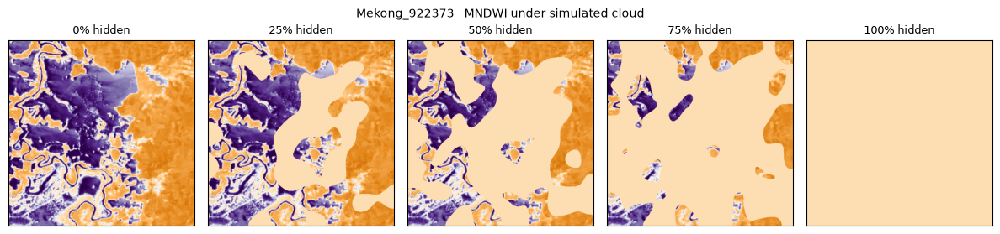

In [14]:
FRACTIONS = (0.0, 0.25, 0.5, 0.75, 1.0)

chip_id = "Mekong_922373"
fig, axes = plt.subplots(1, len(FRACTIONS), figsize=(2.4 * len(FRACTIONS), 2.8))
m = np.percentile(np.abs(water_indices(chip_id)[1]), 98)
for ax, f in zip(axes, FRACTIONS, strict=True):
    oi = occluded_input(chip_id, "s2", f, MEAN, STD)[0][1]
    ax.imshow(oi, cmap=INDEX_CMAPS["MNDWI"], vmin=-m, vmax=m)
    ax.set(title=f"{f:.0%} hidden", xticks=[], yticks=[])
    ax.title.set_fontsize(9)
fig.suptitle(f"{chip_id}   MNDWI under simulated cloud", fontsize=10)
fig.tight_layout()
plt.show()

In [15]:
sweep = {}
for split in ("test", "bolivia"):
    for arm in ("s1+s2", "s2"):
        sweep[split, arm] = [micro_iou(models[arm], arm, splits[split], [0.5], MEAN, STD, f,
                                       f"{split} {arm} {f:.0%}")[0] for f in FRACTIONS]
    flat = micro_iou(models["s1"], "s1", splits[split], [0.5], MEAN, STD, desc=f"{split} s1")[0]
    sweep[split, "s1"] = [flat] * len(FRACTIONS)

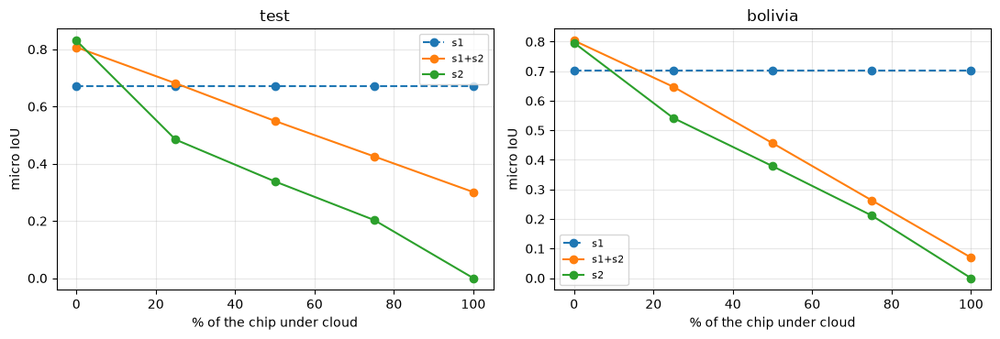

test: s1+s2 drops below radar-only (0.6723) from 50% cloud onward
bolivia: s1+s2 drops below radar-only (0.7009) from 25% cloud onward


In [16]:
fig, axes = plt.subplots(1, 2, figsize=(11, 3.8))
for ax, split in zip(axes, ("test", "bolivia"), strict=True):
    for arm, style in (("s1", "--"), ("s1+s2", "-"), ("s2", "-")):
        ax.plot([f * 100 for f in FRACTIONS], sweep[split, arm], style, marker="o", label=arm)
    ax.set(xlabel="% of the chip under cloud", ylabel="micro IoU", title=split)
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)
fig.tight_layout()
plt.show()

for split in ("test", "bolivia"):
    s1 = sweep[split, "s1"][0]
    below = [f for f, v in zip(FRACTIONS, sweep[split, "s1+s2"], strict=True) if v < s1]
    where = f"from {min(below):.0%} cloud onward" if below else "never"
    print(f"{split}: s1+s2 drops below radar-only ({s1:.4f}) {where}")

As expected, the performance of the `"s1+s2"` arm degrades more gracefully as we increase the cloud coverage. 

Verdict: keep `"s1+s2"`.

## 9. Threshold tuning

Now tuning the decision thresholds of `"s1"` and `"s1+s2"`:

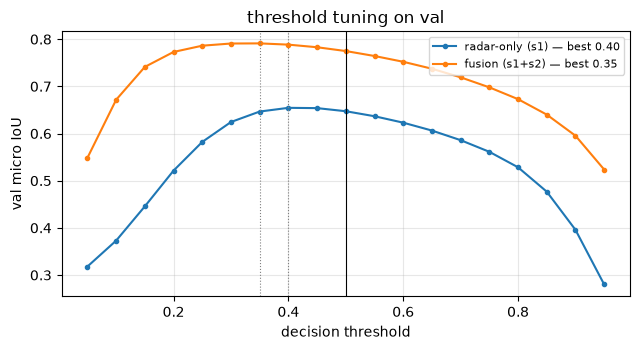

In [17]:
THRESHOLDS = np.round(np.arange(0.05, 0.96, 0.05), 2)
DEPLOY = {"radar-only (s1)": "s1", "fusion (s1+s2)": "s1+s2"}

tuned = {}
fig, ax = plt.subplots(figsize=(6.5, 3.6))
for name, arm in DEPLOY.items():
    ious = micro_iou(models[arm], arm, splits["val"], THRESHOLDS, MEAN, STD, desc=f"val {arm}") # desc is for the progress bar
    tuned[name] = float(THRESHOLDS[ious.argmax()])
    ax.plot(THRESHOLDS, ious, marker=".", label=f"{name} — best {tuned[name]:.2f}")
    ax.axvline(tuned[name], color="grey", linewidth=0.8, linestyle=":")
ax.axvline(0.5, color="black", linewidth=0.8)
ax.set(xlabel="decision threshold", ylabel="val micro IoU", title="threshold tuning on val")
ax.grid(alpha=0.3)
ax.legend(fontsize=8)
fig.tight_layout()
plt.show()

- `"s1"`: 0.40
- `"s1+s2"`: 0.35

In [18]:
rows = []
for name, arm in DEPLOY.items():
    for split in ("test", "bolivia"):
        for label, t in (("0.50 default", 0.5), (f"{tuned[name]:.2f} tuned", tuned[name])):
            r = evaluate_with_chip_id(make_predictor(models[arm], arm, MEAN, STD, t),
                                      splits[split], name)
            rows.append({"model": name, "split": split, "threshold": label,
                         **{k: r["micro"][k] for k in ("iou", "f1", "precision", "recall")},
                         "iou (macro)": r["macro"]["iou"]})

display(pd.DataFrame(rows).set_index(["model", "split", "threshold"]).round(4))

iou      f1  precision  recall  \
model           split   threshold                                         
radar-only (s1) test    0.50 default  0.6723  0.8040     0.8681  0.7487   
                        0.40 tuned    0.6812  0.8104     0.8281  0.7934   
                bolivia 0.50 default  0.7009  0.8241     0.8923  0.7656   
                        0.40 tuned    0.7209  0.8378     0.8534  0.8228   
fusion (s1+s2)  test    0.50 default  0.8071  0.8933     0.9362  0.8541   
                        0.35 tuned    0.8165  0.8990     0.9002  0.8977   
                bolivia 0.50 default  0.8036  0.8911     0.8715  0.9117   
                        0.35 tuned    0.7807  0.8768     0.8222  0.9392   

                                      iou (macro)  
model           split   threshold                  
radar-only (s1) test    0.50 default       0.3637  
                        0.40 tuned         0.3867  
                bolivia 0.50 default       0.4219  
                        0.40 tuned         0.4457  
fusion (s1+s2)  test    0.50 default       0.5196  
                        0.35 tuned         0.5499  
                bolivia 0.50 default       0.5496  
                        0.35 tuned         0.5452

## 10. All together

In [19]:
deployed = {name: make_predictor(models[arm], arm, MEAN, STD, tuned[name])
            for name, arm in DEPLOY.items()}

final = {}
for split in ("test", "bolivia"):
    final[split] = [results[split][0]]      # the threshold baseline, already scored in section 7
    final[split] += [evaluate_with_chip_id(fn, splits[split], name)
                     for name, fn in deployed.items()]
    print(split.upper())
    display(compare(*final[split]))

TEST


,iou (micro),f1 (micro),precision (micro),recall (micro),accuracy (micro),iou (macro),f1 (macro)
threshold (nb02),0.5902,0.7423,0.8219,0.6767,0.9422,0.3142,0.4042
radar-only (s1),0.6812,0.8104,0.8281,0.7934,0.9543,0.3867,0.4841
fusion (s1+s2),0.8165,0.8990,0.9002,0.8977,0.9752,0.5499,0.6568


BOLIVIA


,iou (micro),f1 (micro),precision (micro),recall (micro),accuracy (micro),iou (macro),f1 (macro)
threshold (nb02),0.5951,0.7462,0.9223,0.6265,0.9318,0.3544,0.4567
radar-only (s1),0.7209,0.8378,0.8534,0.8228,0.9490,0.4457,0.5352
fusion (s1+s2),0.7807,0.8768,0.8222,0.9392,0.9578,0.5452,0.6402


### Visualising the errors

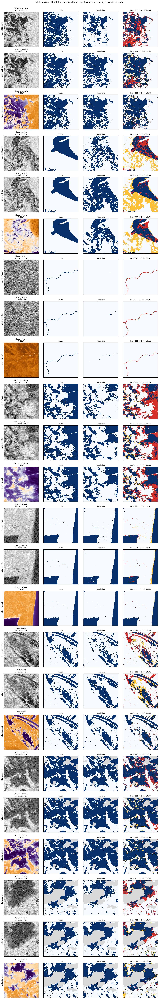

In [20]:
panel = {"threshold (nb02)": baseline_for_chip, **deployed}

rows = len(CHIPS) * len(panel)
fig, axes = plt.subplots(rows, 4, figsize=(13, 3.3 * rows))
for i, chip_id in enumerate(CHIPS):
    for j, (name, for_chip) in enumerate(panel.items()):
        row = axes[i * len(panel) + j]
        first = "MNDWI" if DEPLOY.get(name) == "s1+s2" else "VH"
        error_panel(chip_id, for_chip(chip_id), row, first=first)
        row[0].set_ylabel(name, fontsize=9)

fig.suptitle("white = correct land, blue = correct water, "
             "yellow = false alarm, red = missed flood", y=1)
fig.tight_layout()
plt.show()

## 11. Freezing the models

Let's save each model's `state_dict` along with the configs needed to rebuild it.

In [21]:
VERSIONS = {"python": platform.python_version(), "torch": torch.__version__,
            "cuda": torch.version.cuda, "smp": smp.__version__, "numpy": np.__version__}

MODELS_DIR.mkdir(exist_ok=True)
for name, arm in DEPLOY.items():
    # fp16 halves the file; the round trip costs 4e-5 IoU, ~400x under the restart spread
    torch.save({"state_dict": {k: v.half() for k, v in models[arm].state_dict().items()},
                "arch": f"smp.Unet/{ENCODER}/imagenet",
                "arm": arm, "in_channels": 4 if arm == "s1+s2" else 2,
                "threshold": tuned[name], "normalisation": STATS, "clip": [CLIP_LO, CLIP_HI],
                "epochs": EPOCHS, "seed": 0, "val_iou": best_val[arm],
                "notebook": "03_unet-comparison"},
               MODELS_DIR / f"{name.split()[0]}.pt")

report = {
    "notebook": "03_unet-comparison",
    "created": pd.Timestamp.now().isoformat(timespec="seconds"),
    "versions": VERSIONS,
    "seed": 0,
    "training": {"epochs": EPOCHS, "batch_size": BATCH, "lr": 3e-4, "loss": "masked BCE",
                 "encoder": ENCODER, "selected_on": "val", "selection_metric": "micro_iou"},
    "part1": {"custom-unet": {"arch": "aribu UNet 32-512 bilinear", "val_iou": custom_iou,
                              "params_m": n_params(custom)},
              "smp-unet": {"arch": f"smp.Unet/{ENCODER}/imagenet", "val_iou": smp_iou,
                           "params_m": n_params(smp_unet)}},
    "arms": {arm: {"in_channels": 4 if arm == "s1+s2" else 2, "val_iou": best_val[arm]}
             for arm in ARMS},
    "cloud_sweep": {"fractions": list(FRACTIONS),
                    **{f"{split}/{arm}": v for (split, arm), v in sweep.items()}},
    "deployed": {name: {"arm": arm, "threshold": tuned[name],
                        "checkpoint": f"{name.split()[0]}.pt"} for name, arm in DEPLOY.items()},
    "splits": {split: {r["name"]: {"n_chips": r["n_chips"], "counts": r["counts"],
                                   "micro": r["micro"], "macro": r["macro"]}
                       for r in rs} for split, rs in final.items()},
}
saved = write_json(RESULTS_DIR / "unet.json", report)

for split, rs in final.items():
    for r in rs:
        r["per_chip"].to_csv(RESULTS_DIR / f"unet_per_chip_{split}_{r['name'].split()[0]}.csv",
                             index=False)

print(f"wrote {RESULTS_DIR / 'unet.json'} and {len(DEPLOY)} checkpoints in {MODELS_DIR}")
print(f"\nheadline (test): micro IoU "
      f"{max(saved['splits']['test'][n]['micro']['iou'] for n in DEPLOY):.4f}   "
      f"baseline {BASELINE['headline']['micro_iou']:.4f}")

wrote C:\Dev\Projects\Aribu\data\results\unet.json and 2 checkpoints in C:\Dev\Projects\Aribu\models

headline (test): micro IoU 0.8165   baseline 0.5902
